<a href="https://colab.research.google.com/github/jeffblackadar/CRANE-CCAD-maps/blob/main/text_on_map_tiles_transcription_azure_damas_shared.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

This notebook uses Azure Cognitive Services to transcribe text on an old map.
It then puts the text with its geographic location into a shapefile.
A blog post about it is here: http://jeffblackadar.ca/

In [1]:
# https://towardsdatascience.com/mapping-with-matplotlib-pandas-geopandas-and-basemap-in-python-d11b57ab5dac
# https://stackoverflow.com/questions/54613992/how-to-install-and-use-basemap-on-google-colab
# !apt-get install libgeos-3.6.2 (I am not sure if this is needed)
!apt-get install libgeos-dev
!pip install https://github.com/matplotlib/basemap/archive/master.zip
!pip install geopandas
!pip install contextily
!pip install -U rasterio

Reading package lists... Done
Building dependency tree       
Reading state information... Done
libgeos-dev is already the newest version (3.6.2-1build2).
libgeos-dev set to manually installed.
0 upgraded, 0 newly installed, 0 to remove and 30 not upgraded.
     \ 148.8MB 1.2MB/s
     |████████████████████████████████| 6.5MB 4.0MB/s 
     |████████████████████████████████| 225kB 35.6MB/s 
  Created wheel for basemap: filename=basemap-1.2.2+dev-cp37-cp37m-linux_x86_64.whl size=121759566 sha256=b0f92d70896841cbf8b2557a07e0de7d059c49e00446fd923590581d066cedf2
  Stored in directory: /tmp/pip-ephem-wheel-cache-wtv7gfl4/wheels/98/4a/fc/ce719b75d97e646645c225f3332b1b217536100314922e9572
  Created wheel for pyshp: filename=pyshp-2.1.3-cp37-none-any.whl size=37264 sha256=0451c60e19ff4f909964782e279c6a57001f42ec647c0b5cdb541bf3fc9bc719
  Stored in directory: /root/.cache/pip/wheels/76/2b/d4/53e6b9a0fb0a9f9f29664cf82605af8bc81d5ab44d987896dd
Successfully built basemap pyshp


     |████████████████████████████████| 1.0MB 4.4MB/s 
     |████████████████████████████████| 14.8MB 519kB/s 
     |████████████████████████████████| 19.1MB 1.4MB/s 
Requirement already up-to-date: rasterio in /usr/local/lib/python3.7/dist-packages (1.2.1)


In [2]:
!pip install --upgrade azure-cognitiveservices-vision-computervision

     |████████████████████████████████| 92kB 4.6MB/s 
     |████████████████████████████████| 51kB 5.7MB/s 


In [3]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
settings_path = "/content/drive/MyDrive/william_white/"
    
import os
import json
# Set the file we wan!pip install --upgrade azure-cognitiveservices-vision-computervisiont to use for authenticating an Azure app
# The json file stores the COMPUTER_VISION_SUBSCRIPTION_KEY and COMPUTER_VISION_ENDPOINT so we don't have it in the code.
# The json file looks like this:
# {
# "COMPUTER_VISION_SUBSCRIPTION_KEY":"___the_COMPUTER_VISION_SUBSCRIPTION_KEY___",
# "COMPUTER_VISION_ENDPOINT":"___the_COMPUTER_VISION_ENDPOINT___"
# }
# cv.json contains the credentials for this program.
cv_settings_file = settings_path+'cv.json'
with open(cv_settings_file, "r") as read_file:
    cv_auth_data = json.load(read_file)

os.environ['COMPUTER_VISION_SUBSCRIPTION_KEY']=cv_auth_data["COMPUTER_VISION_SUBSCRIPTION_KEY"]
os.environ['COMPUTER_VISION_ENDPOINT']=cv_auth_data["COMPUTER_VISION_ENDPOINT"]

In [5]:
# https://docs.microsoft.com/en-us/azure/cognitive-services/computer-vision/quickstarts-sdk/python-sdk
from azure.cognitiveservices.vision.computervision import ComputerVisionClient
from azure.cognitiveservices.vision.computervision.models import OperationStatusCodes
from azure.cognitiveservices.vision.computervision.models import VisualFeatureTypes
from msrest.authentication import CognitiveServicesCredentials
from msrest.authentication import CognitiveServicesCredentials

from array import array
import os
from PIL import Image
import sys
import time
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
import geopandas as gpd
import pandas as pd
import contextily as ctx

In [6]:
# Add your Computer Vision subscription key to your environment variables.
if 'COMPUTER_VISION_SUBSCRIPTION_KEY' in os.environ:
    subscription_key = os.environ['COMPUTER_VISION_SUBSCRIPTION_KEY']
else:
    print("\nSet the COMPUTER_VISION_SUBSCRIPTION_KEY environment variable.\n**Restart your shell or IDE for changes to take effect.**")
    sys.exit()
# Add your Computer Vision endpoint to your environment variables.
if 'COMPUTER_VISION_ENDPOINT' in os.environ:
    endpoint = os.environ['COMPUTER_VISION_ENDPOINT']
else:
    print("\nSet the COMPUTER_VISION_ENDPOINT environment variable.\n**Restart your shell or IDE for changes to take effect.**")
    sys.exit()

In [7]:
computervision_client = ComputerVisionClient(endpoint, CognitiveServicesCredentials(subscription_key))

# Set this up for a series of images

In [8]:
import math
def recognize_text_in_local_image(local_image_handwritten_path):
    local_image_handwritten = open(local_image_handwritten_path, "rb")
    # Call API with image and raw response (allows you to get the operation location)
    recognize_handwriting_results = computervision_client.read_in_stream(local_image_handwritten, raw=True, language='fr')

    # Get the operation location (URL with an ID at the end) from the response
    operation_location_remote = recognize_handwriting_results.headers["Operation-Location"]
    # Grab the ID from the URL
    operation_id = operation_location_remote.split("/")[-1]

    # Call the "GET" API and wait for it to retrieve the results 
    while True:
        get_handw_text_results = computervision_client.get_read_result(operation_id)
        if get_handw_text_results.status not in ['notStarted', 'running']:
            break
        time.sleep(1)

    # Print the detected text, line by line
    lines_of_text = []
    if get_handw_text_results.status == OperationStatusCodes.succeeded:
        for text_result in get_handw_text_results.analyze_result.read_results:
            for line in text_result.lines:
                line_data = []  
                print(line.text)
                line_data.append(line.text)
                #print(line.bounding_box)
                line_data.append(line.bounding_box)
                pts = line_data[1]
                xd = abs(pts[4] - pts[0])
                yd = abs(pts[5] - pts[1])
                word_length = math.sqrt((xd ** 2) + (yd ** 2))
            
                letter_length = round(word_length/len(line.text))
                print(letter_length)
                line_data.append(letter_length)
                lines_of_text.append(line_data)
    return(lines_of_text)          


In [9]:
import cv2
import matplotlib.pyplot as plt
import gdal
import geopandas as gpd
import pandas as pd
from shapely.geometry import Point, Polygon

font                   = cv2.FONT_HERSHEY_SIMPLEX
bottomLeftCornerOfText = (10,500)
fontScale              = 1
fontColor              = (0,0,200)
fontColor_small        = (200,0,0)
lineType               = 2

def get_point_from_pixel(x,y, xoffset, px_w, rot1, yoffset, px_h, rot2):
    # supposing x and y are your pixel coordinate this 
    # is how to get the coordinate in space.
    posX = px_w * x + rot1 * y + xoffset
    posY = rot2 * x + px_h * y + yoffset

    posX = (px_w * x) + (rot1 * y) + xoffset
    posY = (px_h * y) + (rot2 * x) + yoffset
    # shift to the center of the pixel
    posX += px_w / 2.0
    posY += px_h / 2.0
    return(posX,posY)

def geocode_labels(local_image_handwritten_path, lines_of_text):
    img = cv2.imread(local_image_handwritten_path)
    img_ds = gdal.Open(local_image_handwritten_path)
    xoffset, px_w, rot1, yoffset, rot2, px_h  = img_ds.GetGeoTransform()

    line_text_poly = gpd.GeoDataFrame()
    line_text_poly['geometry'] = None
    #geotif_crs = 32128
    geotif_crs = 32637
    #geotif_crs = 4326
    line_text_poly.crs = ("EPSG:" + str(geotif_crs))
    line_text_poly.geometry = line_text_poly.geometry.to_crs(crs=geotif_crs)
    line_text_poly.to_crs(crs=geotif_crs)
    line_text_poly = line_text_poly.to_crs(epsg=geotif_crs)
   
    ln = 0
    for l in lines_of_text:
        pts = l[1]
        letter_size = l[2]
        fColor = fontColor
        if(letter_size < 90):
  
            p=[]
            for cn in range(0,4):
                p.append(get_point_from_pixel(pts[0+(cn*2)],pts[1+(cn*2)], xoffset, px_w, rot1, yoffset, px_h, rot2))
            coords = [(p[0][0], p[0][1]), (p[1][0], p[1][1]), (p[2][0], p[2][1]), (p[3][0], p[3][1])]
    
            poly = Polygon(coords)
            new_tp_row = {'id':ln, 'geometry':poly,'text':l[0]}
            line_text_poly = line_text_poly.append(new_tp_row, ignore_index=True)
    
    return(line_text_poly)

In [10]:
        tiles = []

        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r00c00.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r00c03.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r00c01.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r00c02.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r00c04.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r00c06.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r00c07.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r00c05.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r00c08.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r01c01.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r01c00.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r00c12.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r00c09.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r00c10.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r00c11.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r01c02.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r01c03.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r01c04.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r01c08.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r01c09.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r01c07.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r01c06.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r01c10.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r01c05.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r01c11.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r01c12.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r02c00.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r02c02.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r02c01.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r02c03.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r02c04.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r02c07.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r02c05.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r02c08.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r02c06.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r02c09.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r02c10.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r02c12.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r02c11.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r03c00.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r03c03.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r03c02.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r03c05.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r03c04.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r03c01.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r03c07.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r03c06.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r03c10.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r03c08.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r03c11.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r03c09.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r04c02.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r03c12.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r04c01.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r04c00.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r04c06.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r04c07.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r04c03.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r04c05.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r04c04.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r04c08.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r04c09.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r04c12.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r04c10.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r05c00.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r04c11.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r05c03.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r05c02.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r05c01.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r05c05.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r05c04.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r05c07.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r05c08.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r05c06.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r05c10.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r05c09.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r05c11.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r05c12.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r06c00.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r06c01.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r06c03.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r06c04.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r06c05.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r06c02.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r06c07.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r06c06.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r06c11.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r06c10.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r06c09.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r06c08.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r07c01.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r06c12.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r07c00.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r07c05.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r07c04.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r07c02.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r07c03.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r07c08.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r07c06.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r07c07.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r07c12.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r08c00.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r07c10.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r07c11.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r07c09.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r08c04.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r08c01.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r08c02.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r08c03.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r08c07.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r08c08.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r08c06.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r08c05.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r08c09.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r08c10.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r08c12.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r08c11.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r09c00.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r09c03.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r09c02.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r09c04.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r09c01.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r09c05.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r09c06.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r09c07.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r09c10.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r09c08.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r09c09.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r09c12.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r09c11.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r10c01.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r10c00.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r10c04.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r10c03.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r10c02.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r10c07.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r10c05.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r10c06.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r10c10.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r10c08.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r10c09.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r10c12.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r11c00.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r10c11.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r11c01.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r11c02.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r11c04.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r11c03.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r11c07.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r11c05.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r11c06.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r11c08.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r11c09.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r12c00.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r11c11.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r11c10.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r11c12.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r12c04.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r12c03.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r12c01.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r12c02.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r12c05.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r12c08.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r12c06.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r12c07.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r12c09.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r12c12.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r12c11.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r12c10.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r13c02.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r13c01.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r13c00.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r13c04.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r13c06.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r13c03.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r13c05.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r13c07.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r13c10.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r13c09.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r13c12.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r13c08.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r14c00.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r13c11.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r14c01.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r14c02.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r14c03.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r14c04.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r14c06.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r14c05.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r14c07.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r14c08.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r14c11.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r14c09.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r14c10.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r14c12.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r15c03.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r15c00.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r15c04.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r15c02.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r15c01.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r15c05.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r15c07.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r15c09.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r15c06.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r15c08.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r15c12.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r15c11.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r16c00.tif')
        tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r15c10.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r16c03.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r16c01.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r16c02.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r16c07.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r16c05.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r16c04.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r16c06.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r16c08.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r16c09.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r16c10.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r16c12.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r17c00.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r16c11.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r17c02.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r17c03.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r17c01.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r17c06.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r17c07.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r17c05.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r17c04.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r17c10.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r17c09.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r17c08.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r17c11.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r17c12.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r18c00.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r18c01.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r18c02.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r18c03.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r18c04.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r18c05.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r18c06.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r18c10.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r18c07.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r18c08.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r18c11.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r18c09.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r18c12.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r19c00.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r19c04.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r19c01.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r19c02.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r19c03.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r19c08.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r19c06.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r19c07.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r19c05.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r19c11.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r19c09.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r20c00.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r19c10.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r20c01.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r19c12.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r20c02.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r20c03.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r20c04.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r20c05.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r20c06.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r20c07.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r20c10.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r20c09.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r20c08.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r20c12.tif')
        #tiles.append('/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/r20c11.tif')

all_line_text_poly = gpd.GeoDataFrame()
all_line_text_poly['geometry'] = None
geotif_crs = 32637
#geotif_crs = 4326
all_line_text_poly.crs = ("EPSG:" + str(geotif_crs))
all_line_text_poly.geometry = all_line_text_poly.geometry.to_crs(crs=geotif_crs)
all_line_text_poly.to_crs(crs=geotif_crs)
all_line_text_poly = all_line_text_poly.to_crs(epsg=geotif_crs)

for t in tiles:
    lines_of_text = recognize_text_in_local_image(t)
    temp_df = geocode_labels(t,lines_of_text)
    all_line_text_poly = gpd.GeoDataFrame(pd.concat([all_line_text_poly,temp_df], ignore_index=True), crs=all_line_text_poly.crs)

all_line_text_poly.to_file(os.path.join("/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef","all_line_text.shp"))

36º
32
1.89,000
26
34
36
Nebi Rechade
24
Bir Youhmour
20
El Mohaj
20
Taraya
29
Hizzine
19
CHMISTAR
32
Tell Hizzme
18
arerDabad
20
1910
44
B
62
ur
24
El Mohairine
20
Cheilch
14
Majdalount
19
Oouris
33
In BOU
22
Hizzine
19
Tell Hizzme
18
Taibo
31
PALESTINE GRID
52
BAALBEK
39
henchy Abdall
14
A Darda
28
Douris
24
In Bourdar /Ain Magsous
20
Al Amechk
28
Kaou
26
DOUlo¢
21
GRID
52
20'
25
2
84
Dard
36
ech
29
At Kaoukab
24
Ard el Menzate
24
Ain Nagoata
22
E PUBLISHED
54
24
57
to Nebek
23
50:
26
e
39
$2.5
40
5.0'
19
2 6 0.000
27
Khanate
37
NOT TO BE PUB
57
40
36
24
65
-
30
Yabpoud
26
30
35
be
33
Fimel Baïde
18
Bin es ben
18
Bin Ovarde
21
SHEET NI-37-VII.
46
2 6 0.006 º Palmyre
23
37º
34
34º
35
Khanate
37
30
35
be
30
abor Baroun
26
Fimel Bal
18
Eine
21
Bin es Sehrau
18
JAbou Bayouby
21
O
37
37-VII.
35
o
31
34º
34
Tell Hizzme
17
Taibo
35
Talia?
18
Ich en Nebr
17
Britel
20
Haour Taala
19
n Bounaya
19
Khodor
24
CHMISTAR
31
Tell Hizime
18
Aln Acho"
23
KaterDabagh
24
Haouch Shald
20
Talia?
18
Haouche

epsg:32637
epsg:32637


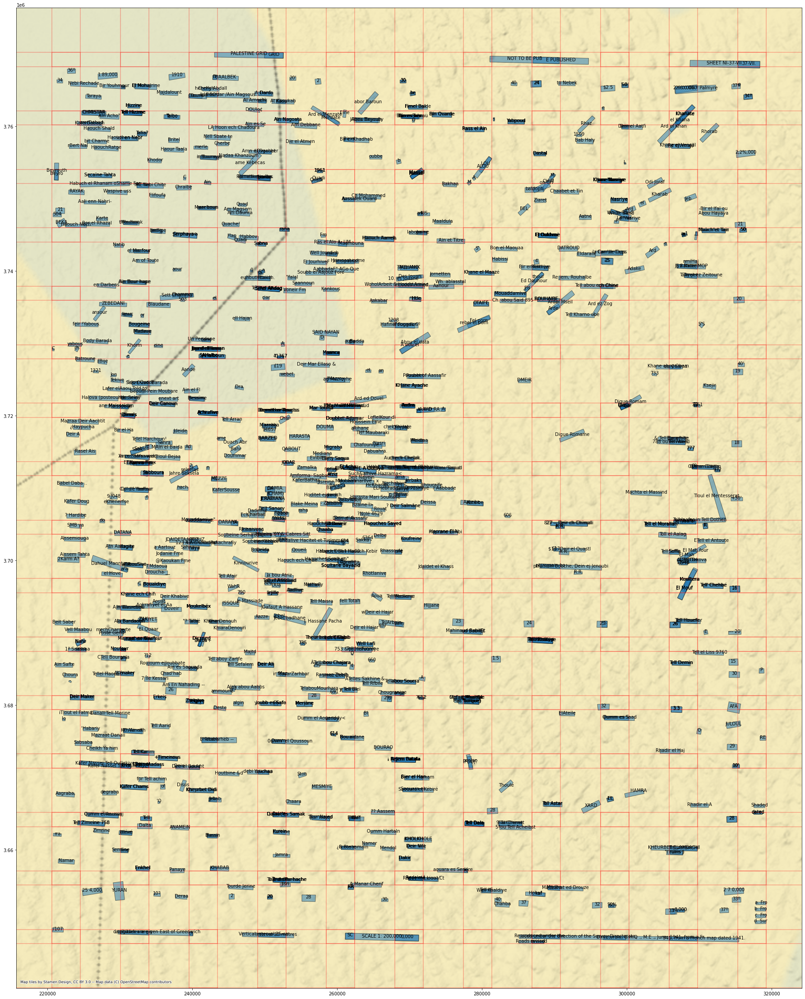

In [13]:
line_text_df=gpd.read_file("/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/all_line_text.shp")

print(line_text_df.crs)
# Change crs to one compatible with basemap
line_text_df = line_text_df.to_crs(epsg=32637) #3857
print(line_text_df.crs)

ax = line_text_df.plot(figsize=(40, 40), alpha=0.5, edgecolor='k')
ctx.add_basemap(ax)

tile_polys_df=gpd.read_file("/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/tile_polys.shp")

#tile_polys_df = tile_polys_df.to_crs(epsg=3857) #3857
tile_polys_df.boundary.plot(ax=ax,color="red",alpha=0.3)

line_text_df['coords'] = line_text_df['geometry'].apply(lambda x: x.representative_point().coords[:])
line_text_df['coords'] = [coords[0] for coords in line_text_df['coords']]
for idx, row in line_text_df.iterrows():
    plt.annotate(s=row['text'], xy=row['coords'], horizontalalignment='center')

In [14]:
glist = line_text_df['geometry']
tlist = line_text_df['text']
rows_to_remove = []
print(len(glist))
for i in range(len(glist)):
    for j in range(i + 1, len(glist)):
        intersect_poly = glist[i].intersection(glist[j])

        if(not intersect_poly.is_empty):
            if(glist[i].area < glist[j].area):
                # glist[i] is smaller
                if(intersect_poly.area/glist[i].area >.8):
                    print("remove i : ", i, j, "{:3.2%}".format(intersect_poly.area/glist[i].area), int(intersect_poly.area), " Remove: ", tlist[i], int(glist[i].area), " Keep: ", tlist[j], int(glist[j].area))
                    rows_to_remove.append(i)
            else:
                if(glist[i].area >= glist[j].area):  
                    if(intersect_poly.area/glist[j].area >.8):
                        print("remove j : ", i, j, "{:3.2%}".format(intersect_poly.area/glist[j].area), int(intersect_poly.area), " Keep: ", tlist[i], int(glist[i].area),  " Remove: ", tlist[j], int(glist[j].area))
                        rows_to_remove.append(j)
                    #else:             
                    #    print("keep both: ", i, j, "{:3.2%}".format(intersect_poly.area/glist[i].area), "{:3.2%}".format(intersect_poly.area/glist[j].area), int(intersect_poly.area), tlist[i], int(glist[i].area), tlist[j], int(glist[j].area))


1127
remove j :  4 13 100.00% 197233  Keep:  Bir Youhmour 1471169  Remove:  ur 197233
remove i :  5 14 94.01% 1008628  Remove:  El Mohaj 1072856  Keep:  El Mohairine 2059876
remove i :  7 19 95.67% 769952  Remove:  Hizzine 804834  Keep:  Hizzine 810477
remove j :  8 82 95.03% 1775530  Keep:  CHMISTAR 2042521  Remove:  CHMISTAR 1868371
remove j :  9 20 96.68% 1290767  Keep:  Tell Hizzme 1360712  Remove:  Tell Hizzme 1335064
remove j :  9 74 98.04% 1228605  Keep:  Tell Hizzme 1360712  Remove:  Tell Hizzme 1253161
remove i :  9 83 94.68% 1288389  Remove:  Tell Hizzme 1360712  Keep:  Tell Hizime 1391233
remove i :  10 85 100.00% 803295  Remove:  arerDabad 803295  Keep:  KaterDabagh 1883418
remove i :  12 23 89.73% 297030  Remove:  B 331030  Keep:  BAALBEK 2075949
remove i :  15 24 80.11% 405319  Remove:  Cheilch 505949  Keep:  henchy Abdall 964450
remove j :  17 26 89.95% 808601  Keep:  Oouris 1200070  Remove:  Douris 898962
remove i :  18 27 90.41% 633637  Remove:  In BOU 700874  Keep:  I

In [15]:
print(rows_to_remove)
# remove the rows
line_text_df_deduplicated = line_text_df
line_text_df_deduplicated = line_text_df_deduplicated.drop(rows_to_remove)
print(len(line_text_df_deduplicated['geometry']))
print(line_text_df_deduplicated['coords'],type(line_text_df_deduplicated['coords']))
print(line_text_df_deduplicated)
print(line_text_df_deduplicated.columns)

print(type(line_text_df_deduplicated))
#we have to drop this since .shp files don't support tuples
line_text_df_deduplicated = line_text_df_deduplicated.drop(columns='coords')
line_text_df_deduplicated.to_file(os.path.join("/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/","all_line_text_deduplicated.shp"))

print(line_text_df_deduplicated.columns)

[13, 5, 7, 82, 20, 74, 9, 10, 12, 15, 26, 18, 74, 20, 21, 31, 34, 35, 29, 104, 105, 40, 45, 46, 47, 51, 114, 63, 64, 66, 56, 118, 56, 57, 71, 72, 73, 118, 130, 119, 74, 76, 77, 80, 169, 93, 109, 111, 144, 165, 107, 164, 111, 111, 112, 115, 127, 117, 118, 122, 159, 190, 124, 139, 203, 213, 159, 190, 140, 142, 139, 139, 165, 155, 172, 182, 157, 158, 159, 167, 162, 262, 269, 202, 212, 243, 189, 234, 303, 304, 222, 293, 306, 305, 213, 215, 207, 208, 210, 243, 212, 222, 222, 225, 228, 229, 266, 237, 267, 241, 243, 289, 290, 349, 251, 272, 258, 279, 282, 309, 342, 264, 275, 309, 342, 295, 288, 302, 306, 299, 301, 309, 312, 323, 380, 407, 324, 382, 408, 381, 388, 319, 330, 331, 323, 407, 324, 408, 360, 346, 340, 341, 341, 396, 348, 396, 352, 361, 354, 355, 374, 414, 418, 436, 379, 379, 379, 407, 381, 408, 416, 385, 385, 499, 386, 386, 386, 396, 400, 393, 466, 394, 468, 499, 399, 401, 447, 466, 404, 404, 404, 405, 405, 405, 484, 418, 485, 500, 420, 420, 424, 424, 449, 425, 426, 428, 435, 508, 

epsg:32637
epsg:32637


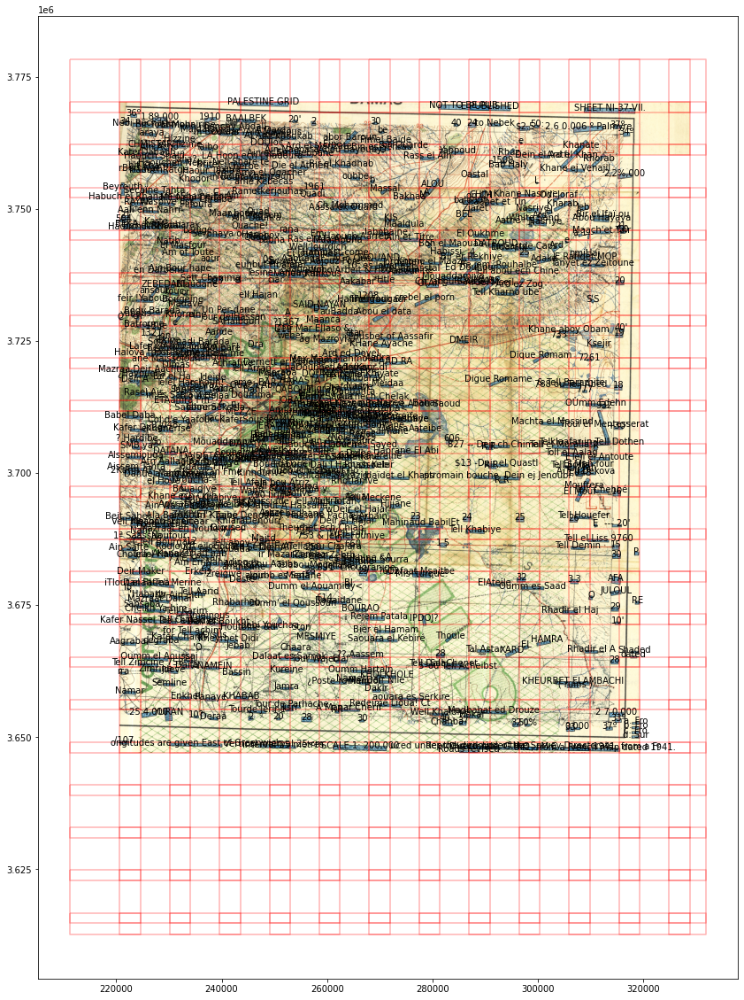

In [16]:
import rasterio
import rasterio.plot
line_text_df=gpd.read_file("/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/all_line_text_deduplicated.shp")
print(line_text_df.crs)
# Change crs to one compatible with basemap
#line_text_df = line_text_df.to_crs(epsg=3857) #3857
#line_text_df = line_text_df.to_crs(epsg=32127) #3857

print(line_text_df.crs)

ax = line_text_df.plot(figsize=(20, 20), alpha=0.5, edgecolor='k')

for tf in tiles:
    tif_file = rasterio.open(tf)
    rasterio.plot.show(tif_file, ax=ax)
#ctx.add_basemap(ax)

tile_polys_df=gpd.read_file("/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/tif_tiles/tile_polys.shp")
#tile_polys_df = tile_polys_df.to_crs(epsg=3857) #3857
#tile_polys_df = tile_polys_df.to_crs(epsg=32637) #3857
tile_polys_df.boundary.plot(ax=ax,color="red",alpha=0.3)

line_text_df['coords'] = line_text_df['geometry'].apply(lambda x: x.representative_point().coords[:])
line_text_df['coords'] = [coords[0] for coords in line_text_df['coords']]
for idx, row in line_text_df.iterrows():
    plt.annotate(s=row['text'], xy=row['coords'],                 horizontalalignment='center')

epsg:32637


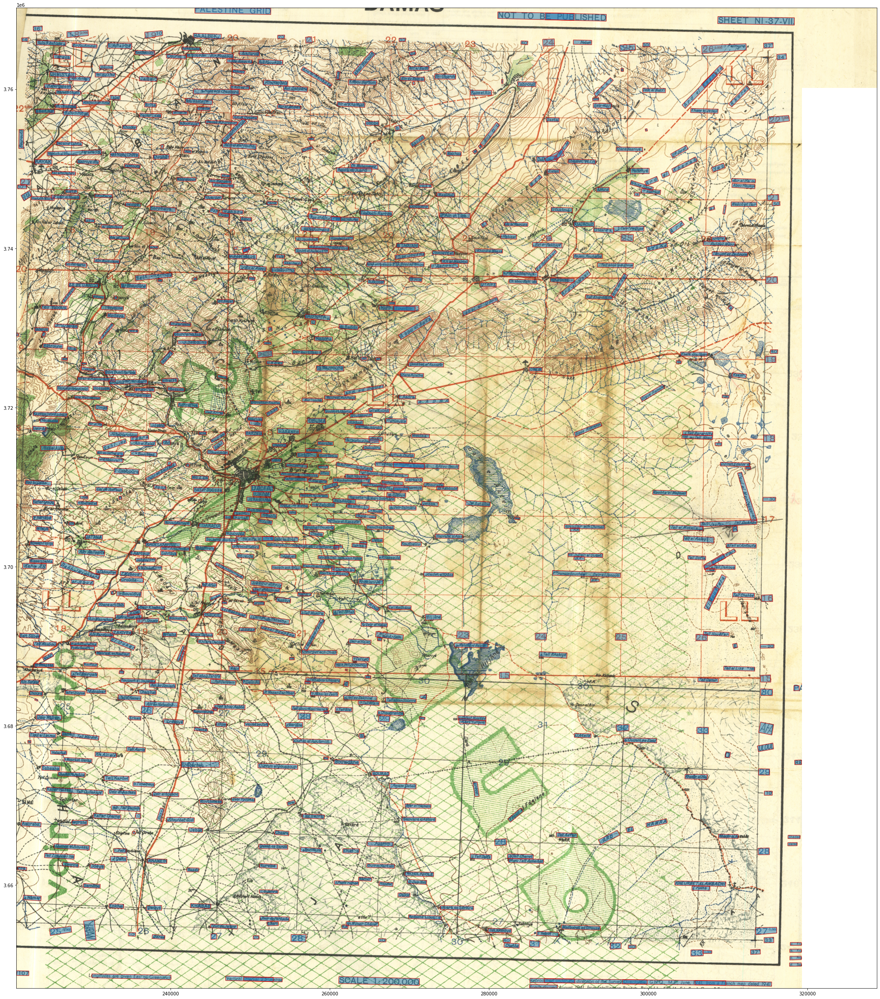

In [18]:
line_text_df=gpd.read_file("/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/all_line_text_deduplicated.shp")
print(line_text_df.crs)
# Change crs to one compatible with basemap
#line_text_df = line_text_df.to_crs(epsg=3857) #3857
#line_text_df = line_text_df.to_crs(epsg=4326) #3857
ax = line_text_df.plot(figsize=(40, 40), alpha=0.5, edgecolor='k')
for tf in tiles:
    tif_file = rasterio.open(tf)
    rasterio.plot.show(tif_file, ax=ax)

line_text_df.boundary.plot(ax=ax,color="red",alpha=0.5)


In [19]:
#Remove all of the labels that have only numbers
import rasterio
import rasterio.plot

line_text_dedup_df=gpd.read_file("/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/all_line_text_deduplicated.shp")
print(line_text_dedup_df.crs)

glist_dedup = line_text_dedup_df['geometry']
tlist_dedup = line_text_dedup_df['text']
rows_dedup_to_remove = []
print(len(glist_dedup))
for i in range(len(glist_dedup)):
    print(" i : ", i, tlist_dedup[i])
    if(tlist_dedup[i].isnumeric()):
        rows_dedup_to_remove.append(i)
        print("remove i : ", i, tlist_dedup[i])

print(rows_dedup_to_remove)
# remove the rows
line_text_df_no_nums = line_text_dedup_df
line_text_df_no_nums = line_text_dedup_df.drop(rows_dedup_to_remove)
print(len(line_text_df_no_nums['geometry']))

#print(line_text_df_no_nums['coords'],type(line_text_df_no_nums['coords']))
print(line_text_df_no_nums)
print(line_text_df_no_nums.columns)

print(type(line_text_df_no_nums))

line_text_df_no_nums.to_file(os.path.join("/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/","all_line_text_no_nums.shp"))

print(line_text_df_deduplicated.columns)

epsg:32637
718
 i :  0 36º
 i :  1 1.89,000
 i :  2 34
remove i :  2 34
 i :  3 Nebi Rechade
 i :  4 Bir Youhmour
 i :  5 Taraya
 i :  6 CHMISTAR
 i :  7 1910
remove i :  7 1910
 i :  8 El Mohairine
 i :  9 Majdalount
 i :  10 Oouris
 i :  11 Hizzine
 i :  12 PALESTINE GRID
 i :  13 BAALBEK
 i :  14 henchy Abdall
 i :  15 A Darda
 i :  16 In Bourdar /Ain Magsous
 i :  17 Al Amechk
 i :  18 DOUlo¢
 i :  19 20'
 i :  20 2
remove i :  20 2
 i :  21 At Kaoukab
 i :  22 Ard el Menzate
 i :  23 Ain Nagoata
 i :  24 E PUBLISHED
 i :  25 to Nebek
 i :  26 50:
 i :  27 e
 i :  28 $2.5
 i :  29 NOT TO BE PUB
 i :  30 40
remove i :  30 40
 i :  31 24
remove i :  31 24
 i :  32 Yabpoud
 i :  33 30
remove i :  33 30
 i :  34 be
 i :  35 Fimel Baïde
 i :  36 SHEET NI-37-VII.
 i :  37 2 6 0.006 º Palmyre
 i :  38 37º
 i :  39 34º
 i :  40 Khanate
 i :  41 abor Baroun
 i :  42 Eine
 i :  43 Bin es Sehrau
 i :  44 JAbou Bayouby
 i :  45 O
 i :  46 Taibo
 i :  47 Britel
 i :  48 Haour Taala
 i :  49 Kho

In [20]:
#Retain Tell and Roman
import rasterio
import rasterio.plot
import geopandas as gpd
import os

line_text_no_nums_df=gpd.read_file("/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/all_line_text_no_nums.shp")
print(line_text_no_nums_df.crs)

glist_no_nums = line_text_no_nums_df['geometry']
tlist_no_nums = line_text_no_nums_df['text']
rows_no_nums_to_remove = []
print(len(glist_no_nums))

#if "blah" not in somestring: 
ruins_text  = []
ruins_text.append("romam")
ruins_text.append("roman")
ruins_text.append("romai")
ruins_text.append("digue")
ruins_text.append("ell")
ruins_text.append("r.r.")

for i in range(len(glist_no_nums)):
    #print(" i : ", i, tlist_no_nums[i])
    #x in str for x in myList
    remove = True
    for rt in ruins_text:
        if(rt in tlist_no_nums[i].lower()):
            remove = False
        
    if (remove == True):
        rows_no_nums_to_remove.append(i)
        #print("remove i : ", i, tlist_no_nums[i].lower())
    else:
        print("keep i : ", i, tlist_no_nums[i])

print(rows_no_nums_to_remove)
# remove the rows
line_text_df_ruins = line_text_no_nums_df
line_text_df_ruins = line_text_no_nums_df.drop(rows_no_nums_to_remove)
print(len(line_text_df_ruins['geometry']))

#print(line_text_df_no_nums['coords'],type(line_text_df_no_nums['coords']))
print(line_text_df_ruins)
print(line_text_df_ruins.columns)

print(type(line_text_df_ruins))
line_text_df_ruins.to_file(os.path.join("/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/","all_line_text_ruins.shp"))
print(line_text_df_ruins.columns)

epsg:32637
658
keep i :  44 Tell Hizime
keep i :  56 Nell Sbate te
keep i :  169 Well Jourdich
keep i :  182 Tell abou ech Chine
keep i :  190 ell Hajan
keep i :  221 Tell Kharno ube
keep i :  240 Deir Mar Ellaso &
keep i :  263 Dique Romam
keep i :  303 Tell Arran
keep i :  308 Digue Romame
keep i :  313 & Tell Bararhite
keep i :  314 788 ou Tell Abed
keep i :  350 R.R.
keep i :  379 Telklaafar in Tell Dothen
keep i :  388 Tell Afair
keep i :  408 Tell el Assouad
keep i :  428 ETell el Antoute
keep i :  430 AiTell Dekova
keep i :  433 Tell' Chehbé
keep i :  436 R.R.
keep i :  437 ptromain bouche, Dein ej Jenoubi
keep i :  438 R.R.
keep i :  439 Tell el Moralla!?
keep i :  441 Tell Soffa
keep i :  446 Vell Maabou
keep i :  452 Tell Maisra
keep i :  475 Tell Meckene
keep i :  476 fell Totah
keep i :  483 Tell Houefer
keep i :  489 CTell Bourgala
keep i :  492 Tellel Haoua
keep i :  504 ÀTellabou Chajara
keep i :  511 Tell aboy Zartfe
keep i :  512 Tell Sefalem
keep i :  517 Tell Khabiye

In [21]:
import geopandas
line_text_df_ruins_file = os.path.join("/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/","all_line_text_ruins.shp")
shp_file = geopandas.read_file(line_text_df_ruins_file)
shp_file.to_file(os.path.join("/content/drive/MyDrive/crane_maps_syria/maps_large/Damas_georef/","all_line_text_ruins.geojson"), driver='GeoJSON')

Download /content/line_text.shp to use it in other maps such as ArcGIS Map. 